In [2]:
import pandas as pd
import seaborn as sns
import pickle
from sklearn.model_selection import train_test_split, GridSearchCV,cross_val_score
from sklearn.pipeline import make_pipeline
from category_encoders import OneHotEncoder,OrdinalEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import ConfusionMatrixDisplay,classification_report
from sklearn.tree import DecisionTreeClassifier
import matplotlib.pyplot as plt
from imblearn.over_sampling import RandomOverSampler
from pandasql import sqldf
from xgboost import XGBClassifier
import plotly.express as px

In [3]:
def wrangle(filename):  
  # Reading from csv file
  df = pd.read_csv(filename,index_col = "building_id")

  # Dropping rows with NA values
  df.dropna(inplace=True)

  # Dropping columns containing post eq information
  df.drop(columns=["count_floors_post_eq","height_ft_post_eq","condition_post_eq","technical_solution_proposed"],inplace=True)

  # Dropping columns with not_req id
  df.drop(columns=["district_id","vdcmun_id"],inplace=True)

  #Dropping height_ft_pre_eq as it is correlated to count_floors_pre_eq
  df.drop(columns="height_ft_pre_eq",inplace=True)

  return df

In [5]:
df = wrangle("csv_building_structure.csv")
df.head()

,ward_id,count_floors_pre_eq,age_building,plinth_area_sq_ft,land_surface_condition,foundation_type,roof_type,ground_floor_type,other_floor_type,position,...,has_superstructure_stone_flag,has_superstructure_cement_mortar_stone,has_superstructure_mud_mortar_brick,has_superstructure_cement_mortar_brick,has_superstructure_timber,has_superstructure_bamboo,has_superstructure_rc_non_engineered,has_superstructure_rc_engineered,has_superstructure_other,damage_grade
building_id,,,,,,,,,,,,,,,,,,,,,
120101000011,120703,1,9,288,Flat,Other,Bamboo/Timber-Light roof,Mud,Not applicable,Not attached,...,0,0,0,0,0,1,0,0,0,Grade 3
120101000021,120703,1,15,364,Flat,Other,Bamboo/Timber-Light roof,Mud,Not applicable,Not attached,...,0,0,0,0,0,1,0,0,0,Grade 5
120101000031,120703,1,20,384,Flat,Other,Bamboo/Timber-Light roof,Mud,Not applicable,Not attached,...,0,0,0,0,0,0,0,0,0,Grade 2
120101000041,120703,1,20,312,Flat,Other,Bamboo/Timber-Light roof,Mud,Not applicable,Not attached,...,0,0,0,0,0,0,0,0,0,Grade 2
120101000051,120703,1,30,308,Flat,Other,Bamboo/Timber-Light roof,Mud,Not applicable,Not attached,...,0,0,0,0,0,0,0,0,0,Grade 1


In [6]:
# Refer to earthquake_data_vis for these removals
df.drop(columns="has_superstructure_cement_mortar_brick",inplace=True)
df.drop(columns="has_superstructure_bamboo",inplace=True)

In [7]:
df_mapping = pd.read_csv("ward_level_pred_intensity_kriging.csv")
df_mapping.drop(columns=["latitude","longitude"],inplace=True)
df_mapping.head()

,ward_id,pred_intensity
0,120101,6.861444
1,120102,6.965834
2,120103,6.920959
3,120104,6.736564
4,120105,6.761312


In [8]:
pysqldf = lambda q: sqldf(q, globals())

In [9]:
df = pysqldf("""
    select *
    from df
    inner join df_mapping
    on df.ward_id = df_mapping.ward_id
""")

In [10]:
df.drop(columns="ward_id",inplace=True)

In [11]:
df.set_index('building_id',inplace=True)

In [12]:
damage = {
    "Grade 1" : 0,
    "Grade 2" : 1,
    "Grade 3" : 2,
    "Grade 4" : 3,
    "Grade 5" : 4
}
df["damage_grade"]=df["damage_grade"].replace(damage)

C:\Users\Dell\AppData\Local\Temp\ipykernel_7804\43839025.py:8: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df["damage_grade"]=df["damage_grade"].replace(damage)


## Visualization

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 759998 entries, 120101000011 to 366709001281
Data columns (total 21 columns):
 #   Column                                  Non-Null Count   Dtype  
---  ------                                  --------------   -----  
 0   count_floors_pre_eq                     759998 non-null  int64  
 1   age_building                            759998 non-null  int64  
 2   plinth_area_sq_ft                       759998 non-null  int64  
 3   land_surface_condition                  759998 non-null  object 
 4   foundation_type                         759998 non-null  object 
 5   roof_type                               759998 non-null  object 
 6   ground_floor_type                       759998 non-null  object 
 7   other_floor_type                        759998 non-null  object 
 8   position                                759998 non-null  object 
 9   plan_configuration                      759998 non-null  object 
 10  has_superstructure_adobe_mud    

In [14]:
fig = px.histogram(df,x="count_floors_pre_eq",title="Number of Floors in a Building",)

fig.show()



In [15]:
# X, y Split
target = "damage_grade"
X = df.drop(columns=target)
y = df[target]
print(f"X = {X.shape}, y = {y.shape}")

X = (759998, 20), y = (759998,)


In [16]:
# Train,Test Split
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2,random_state=42)

print(X_train.shape,y_train.shape)
print(X_test.shape,y_test.shape)

(607998, 20) (607998,)
(152000, 20) (152000,)


In [17]:
model = make_pipeline(OrdinalEncoder(),XGBClassifier(verbosity= 3,random_state =42, colsample_bytree = 0.9,learning_rate=0.1, max_depth=7, min_child_weight = 1,n_estimators=200,subsample = 0.7))

In [18]:
model.fit(X_train,y_train)

[13:51:05] ======== Monitor (0): HostSketchContainer ========
[13:51:05] AllReduce: 0.002133s, 1 calls @ 2133us

[13:51:05] MakeCuts: 0.002282s, 1 calls @ 2282us

[13:51:05] DEBUG: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\gbm\gbtree.cc:130: Using tree method: 0
[13:52:01] ======== Monitor (0): Learner ========
[13:52:01] Configure: 0.077155s, 1 calls @ 77155us

[13:52:01] EvalOneIter: 0.002376s, 200 calls @ 2376us

[13:52:01] GetGradient: 9.04446s, 200 calls @ 9044460us

[13:52:01] PredictRaw: 0.003296s, 200 calls @ 3296us

[13:52:01] UpdateOneIter: 55.8992s, 200 calls @ 55899175us

[13:52:01] ======== Monitor (0): GBTree ========
[13:52:01] BoostNewTrees: 46.7719s, 200 calls @ 46771921us

[13:52:01] CommitModel: 0.000361s, 200 calls @ 361us

[13:52:01] ======== Monitor (0): HistUpdater ========
[13:52:01] BuildHistogram: 7.73221s, 6000 calls @ 7732210us

[13:52:01] EvaluateSplits: 0.582375s, 7000 calls @ 582

Pipeline(steps=[('ordinalencoder',
                 OrdinalEncoder(cols=['land_surface_condition',
                                      'foundation_type', 'roof_type',
                                      'ground_floor_type', 'other_floor_type',
                                      'position', 'plan_configuration'],
                                mapping=[{'col': 'land_surface_condition',
                                          'data_type': dtype('O'),
                                          'mapping': Moderate slope    1
Flat              2
Steep slope       3
NaN              -2
dtype: int64},
                                         {'col': 'foundation_type',
                                          'data_type': dtype('O'...
                               feature_types=None, gamma=None, grow_policy=None,
                               importance_type=None,
                               interaction_constraints=None, learning_rate=0.1,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=7, max_leaves=None, min_child_weight=1,
                               missing=nan, monotone_constraints=None,
                               multi_strategy=None, n_estimators=200,
                               n_jobs=None, num_parallel_tree=None,
                               objective='multi:softprob', ...))])

In [19]:
train_acc = model.score(X_train,y_train)
test_acc = model.score(X_test,y_test)
print(f"Training Accuracy = {train_acc}")
print(f"Testing Accuracy = {test_acc}")

[13:52:18] DEBUG: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\gbm\gbtree.cc:130: Using tree method: 0
Training Accuracy = 0.5483471985105214
Testing Accuracy = 0.5311052631578947


In [20]:
importances = model.named_steps["xgbclassifier"].feature_importances_
feature_names = X_train.columns

df_importances = pd.DataFrame({
    'Features':feature_names,
    'Importances' : importances
}).sort_values(by='Importances', ascending=False)
df_importances.head(10)

,Features,Importances
11,has_superstructure_mud_mortar_stone,0.439641
12,has_superstructure_stone_flag,0.077050
4,foundation_type,0.068314
19,pred_intensity,0.055628
10,has_superstructure_adobe_mud,0.043981
5,roof_type,0.037691
14,has_superstructure_mud_mortar_brick,0.033691
7,other_floor_type,0.033030
0,count_floors_pre_eq,0.028450
6,ground_floor_type,0.026306


<Axes: xlabel='Importances', ylabel='Features'>

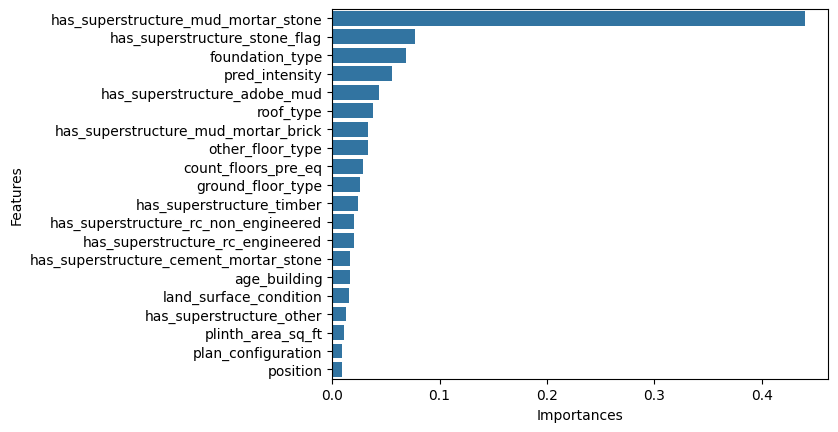

In [21]:
sns.barplot(x="Importances",y="Features",data=df_importances)

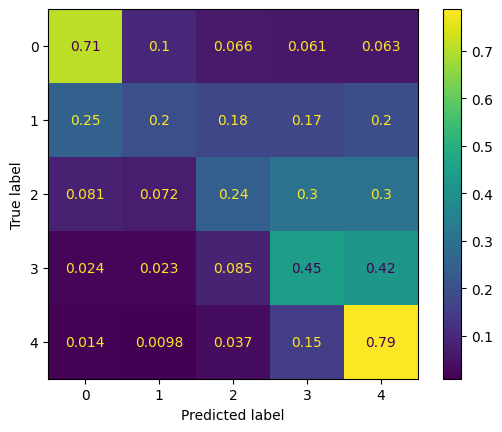

In [22]:
ConfusionMatrixDisplay.from_estimator(model,X_test,y_test,normalize='true')

In [23]:
print(classification_report(y_test,model.predict(X_test)))

              precision    recall  f1-score   support

           0       0.58      0.71      0.64     15863
           1       0.41      0.20      0.27     17405
           2       0.42      0.24      0.31     27415
           3       0.44      0.45      0.44     36601
           4       0.61      0.79      0.68     54716

    accuracy                           0.53    152000
   macro avg       0.49      0.48      0.47    152000
weighted avg       0.51      0.53      0.51    152000

